In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np

from astropy.coordinates import SkyCoord
import astropy.coordinates as coord
from astropy import constants as const
from astropy import units as u
from astropy.time import Time
from astropy.table import Table, QTable, vstack
import os

from astroquery.gaia import Gaia

from astropy.timeseries import LombScargle, TimeSeries
import random

import sys
sys.path.append('..')
import ellipsoid

#### SN SkyCoord Objects

In [2]:
# Properties of SN1054 (Crab Nebula)
tC = Time({'year': 1054, 'month': 7, 'day': 4}, format='ymdhms')

cC_radec = SkyCoord.from_name('SN 1054')

# https://vizier.cds.unistra.fr/viz-bin/VizieR-4 database (photogeometric distance)
dC = 1899.33655000 * u.pc
dC_err = (2193.16919000-1711.93213000)/2 * u.pc

cC = SkyCoord(ra=cC_radec.ra, dec=cC_radec.dec, distance=dC)

/mnt_home/anilipour/setiellipsoid/setienv/lib/python3.7/site-packages/erfa/core.py:155: ErfaWarning: ERFA function "dtf2d" yielded 1 of "dubious year (Note 6)"
  ErfaWarning)


In [3]:
# Properties of SN1987A
tA = Time({'year': 1987, 'month': 2, 'day': 23}, format='ymdhms')

cA_radec = SkyCoord.from_name('SN 1987A')

# Panagia (1999) https://ui.adsabs.harvard.edu/abs/1999IAUS..190..549P/abstract
dA = 51.4 * u.kpc
dA_err = 1.2 * u.kpc

cA = SkyCoord(ra=cA_radec.ra, dec=cA_radec.dec, distance=dA)

In [4]:
# Properties of SN1604 (Kepler)
tK = Time({'year': 1604, 'month': 10, 'day': 9}, format='ymdhms')

cK_radec = SkyCoord.from_name('SN 1604')

dK = 16600 * u.lyr
dK_err = 0.14*dK

cK = SkyCoord(ra=cK_radec.ra, dec=cK_radec.dec, distance=dK)

In [5]:
# Properties of SN1572 (Tycho)
tT = Time({'year': 1572, 'month': 11, 'day': 2}, format='ymdhms')

cT_radec = SkyCoord.from_name('SN 1572')

dT = 8970 * u.lyr
dT_err = 0.09*dT

cT = SkyCoord(ra=cT_radec.ra, dec=cT_radec.dec, distance=dT)

Read in Gaia variable stars

In [6]:
file_name = '../Gaia_var_class'
c1, stars = ellipsoid.readFile(file_name)
tol = 0.1

Get all crossing stars with error

In [7]:
cA_x, starsA_x = ellipsoid.crossErrorEllipsoid(cA, tA, c1, stars, tol)
print(f'{len(starsA_x)} stars have crossed the SN1987A ellipsoid during Gaia DR3 data collection time')

217 stars have crossed the SN1987A ellipsoid during Gaia DR3 data collection time


In [8]:
cC_x, starsC_x = ellipsoid.crossErrorEllipsoid(cC, tC, c1, stars, tol)
print(f'{len(starsC_x)} stars have crossed the SN1054 ellipsoid during Gaia DR3 data collection time')

8 stars have crossed the SN1054 ellipsoid during Gaia DR3 data collection time


/mnt_home/anilipour/setiellipsoid/setienv/lib/python3.7/site-packages/erfa/core.py:155: ErfaWarning: ERFA function "utctai" yielded 1 of "dubious year (Note 3)"
  ErfaWarning)


In [9]:
cK_x, starsK_x = ellipsoid.crossErrorEllipsoid(cK, tK, c1, stars, tol)
print(f'{len(starsK_x)} stars have crossed the SN1604 ellipsoid during Gaia DR3 data collection time')

121 stars have crossed the SN1604 ellipsoid during Gaia DR3 data collection time


In [10]:
cT_x, starsT_x = ellipsoid.crossErrorEllipsoid(cT, tT, c1, stars, tol)
print(f'{len(starsT_x)} stars have crossed the SN1572 ellipsoid during Gaia DR3 data collection time')

119 stars have crossed the SN1572 ellipsoid during Gaia DR3 data collection time


In [11]:
stars_x = vstack([starsA_x, starsC_x, starsK_x, starsT_x])
c1_x = coord.concatenate([cA_x, cC_x, cK_x, cT_x])

In [12]:
len(stars_x)

465

Crossing stars without error

In [13]:
startTime = Time('2014-07-25T10:30')
endTime = Time('2017-05-28T08:44')

In [14]:
cA_x_wo, starsA_x_wo = ellipsoid.crossEllipsoid(cA, tA, c1, stars, tol, start=startTime, end=endTime)
print(f'{len(starsA_x_wo)} stars have crossed the SN1987A ellipsoid during Gaia DR3 data collection time')

4416 stars have crossed the SN1987A ellipsoid during Gaia DR3 data collection time


In [15]:
cC_x_wo, starsC_x_wo = ellipsoid.crossEllipsoid(cC, tC, c1, stars, tol, start=startTime, end=endTime)
print(f'{len(starsC_x_wo)} stars have crossed the SN1054 ellipsoid during Gaia DR3 data collection time')

1810 stars have crossed the SN1054 ellipsoid during Gaia DR3 data collection time


In [16]:
cK_x_wo, starsK_x_wo = ellipsoid.crossEllipsoid(cK, tK, c1, stars, tol, start=startTime, end=endTime)
print(f'{len(starsK_x_wo)} stars have crossed the SN1604 ellipsoid during Gaia DR3 data collection time')

3358 stars have crossed the SN1604 ellipsoid during Gaia DR3 data collection time


In [17]:
cT_x_wo, starsT_x_wo = ellipsoid.crossEllipsoid(cT, tT, c1, stars, tol, start=startTime, end=endTime)
print(f'{len(starsT_x_wo)} stars have crossed the SN1572 ellipsoid during Gaia DR3 data collection time')

2429 stars have crossed the SN1572 ellipsoid during Gaia DR3 data collection time


In [18]:
stars_x_wo = vstack([starsA_x_wo, starsC_x_wo, starsK_x_wo, starsT_x_wo])
c1_x_wo = coord.concatenate([cA_x_wo, cC_x_wo, cK_x_wo, cT_x_wo])

Plot

In [19]:
within200 = (np.abs(stars['x']) < 200) & (np.abs(stars['z']) < 200) & (np.abs(stars['y']) < 200)
np.sum(within200)

183152

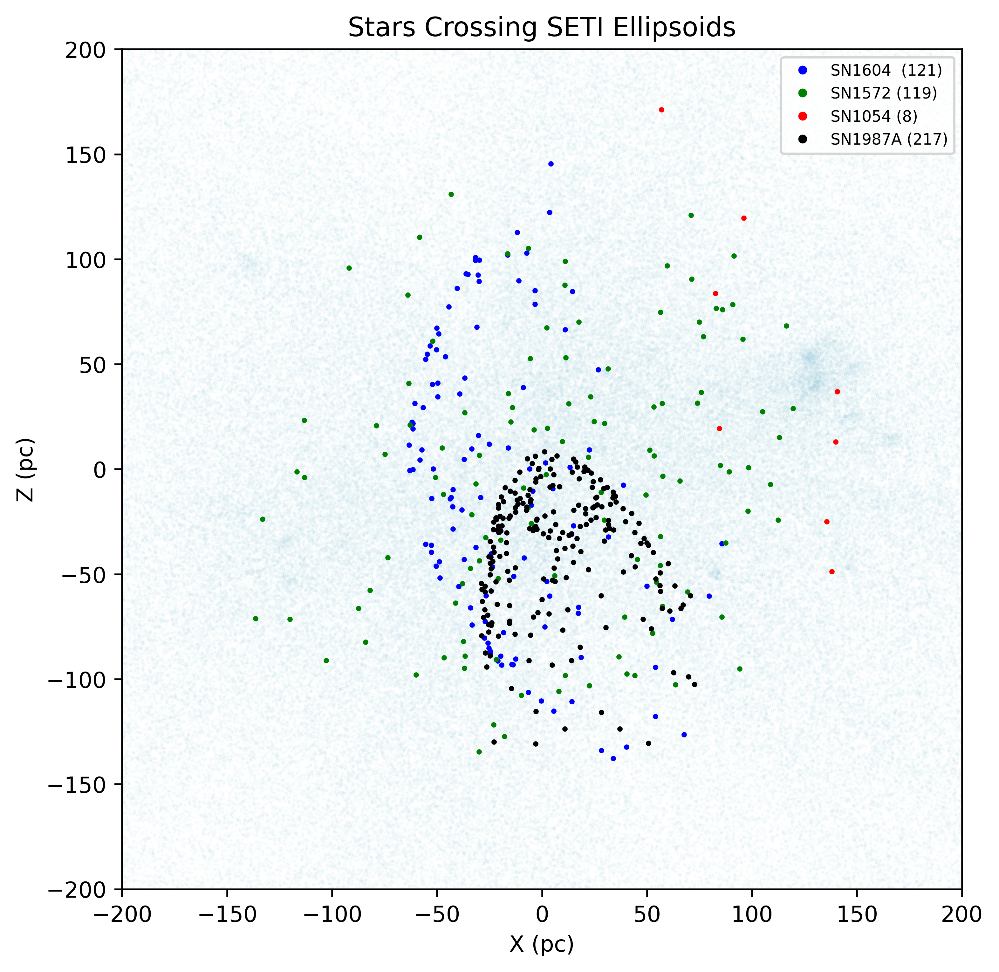

In [20]:
from matplotlib.lines import Line2D
legend_labels = [Line2D([0], [0], color='b', marker='.', lw=0, label=f'SN1604  ({len(starsK_x)})'),
                Line2D([0], [0], color='g', marker='.', lw=0, label=f'SN1572 ({len(starsT_x)})'),
                Line2D([0], [0], color='r', marker='.', lw=0, label=f'SN1054 ({len(starsC_x)})'),
                Line2D([0], [0], color='black', marker='.', lw=0, label=f'SN1987A ({len(starsA_x)})')]



fig = plt.figure(dpi=500,figsize=(8,6), constrained_layout=True)
ax = fig.add_subplot()

ax.set_aspect('equal', adjustable='box')


ax.scatter(stars[within200]['x'], stars[within200]['z'], c='lightblue', s=0.1, alpha=0.1, rasterized=True)

ax.scatter(starsK_x['x'], starsK_x['z'], c='b', s=2, alpha=1, rasterized=True)
ax.scatter(starsT_x['x'], starsT_x['z'], c='g', s=2, alpha=1, rasterized=True)
ax.scatter(starsC_x['x'], starsC_x['z'], c='r', s=2, alpha=1, rasterized=True)
ax.scatter(starsA_x['x'], starsA_x['z'], c='black', s=2, alpha=1, rasterized=True)



ax.set_xlabel('X (pc)')
ax.set_ylabel('Z (pc)')
ax.set_xlim(-200, 200)
ax.set_ylim(-200, 200)
ax.set_title('Stars Crossing SETI Ellipsoids')


ax.legend(handles=legend_labels, prop={'size': 7})

plt.savefig('../Figures/Ellipsoid_Crossings.png', dpi=500, format='png', bbox_inches='tight')

In [73]:
within22000 = (np.abs(stars['x']) < 22000) & (np.abs(stars['z']) < 22000) & (np.abs(stars['y']) < 200)
np.sum(within200)

183152

In [76]:
np.max(stars_x_wo['x'])

5330.065993506859

Text(0.5, 1.0, 'Stars Crossing SETI Ellipsoids')

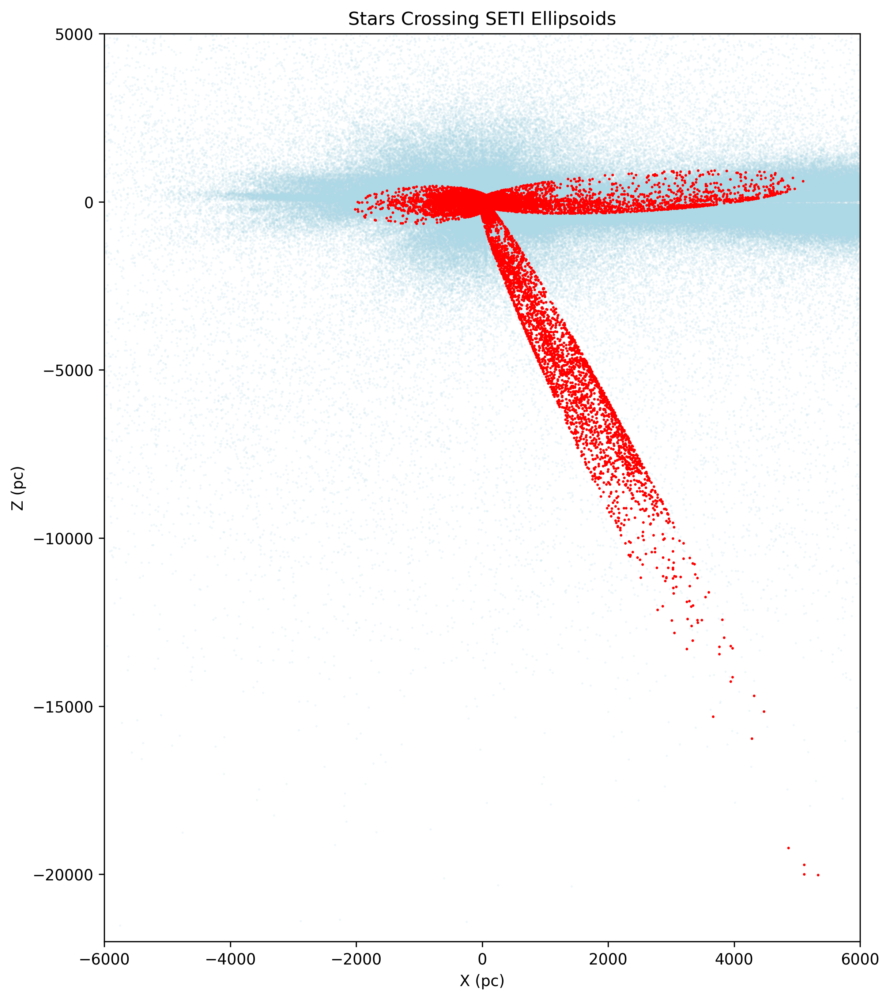

In [91]:
fig = plt.figure(dpi=300,figsize=(8,9), constrained_layout=True)
ax = fig.add_subplot()

#ax.set_aspect('equal', adjustable='box')


ax.scatter(stars[within22000]['x'], stars[within22000]['z'], c='lightblue', s=0.2, alpha=0.2, rasterized=True)
ax.scatter(stars_x_wo['x'], stars_x_wo['z'], c='r', s=0.5, alpha=1, rasterized=True)



ax.set_xlabel('X (pc)')
ax.set_ylabel('Z (pc)')
ax.set_xlim(-6000, 6000)
ax.set_ylim(-22000, 5000)
ax.set_title('Stars Crossing SETI Ellipsoids')

In [ ]:
from matplotlib.lines import Line2D
legend_labels = [Line2D([0], [0], color='b', marker='.', lw=0, label=f'SN1604  ({np.sum(inRangeC)})'),
                Line2D([0], [0], color='g', marker='.', lw=0, label=f'SN1572 ({len(gaiaRingsK)})'),
                Line2D([0], [0], color='r', marker='.', lw=0, label=f'SN1054 ({len(gaiaRingsT)})')]
                Line2D([0], [0], color='black', marker='.', lw=0, label=f'SN1987A ({len(gaiaRingsA)})')]
            
            
fig = plt.figure(dpi=500,figsize=(8,6), constrained_layout=True)
ax = fig.add_subplot()

ax.set_aspect('equal', adjustable='box')


ax.scatter(stars[within200]['x'], stars[within200]['z'], c='lightblue', s=0.2, alpha=0.2, rasterized=True)
ax.scatter(stars_x['x'], stars_x['z'], c='r', s=1, alpha=1, rasterized=True)



ax.set_xlabel('X (pc)')
ax.set_ylabel('Z (pc)')
ax.set_xlim(-200, 200)
ax.set_ylim(-200, 200)
ax.set_title('Stars Crossing SETI Ellipsoids')